In [1]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import torch
import sklearn
from sklearn.model_selection import train_test_split
from torch import nn
from torch.nn import functional as F
from torch.utils.data import TensorDataset, DataLoader
import pandas as pd
from sklearn.metrics import accuracy_score
from transformers import AutoTokenizer, AutoModel
from torch.autograd import Variable
from tqdm.autonotebook import trange
import sklearn.metrics as metrica
from torch.optim import lr_scheduler
import warnings
warnings.filterwarnings("ignore")

In [112]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from tqdm._tqdm_notebook import tqdm_notebook

In [144]:
transactions = pd.read_csv(r"transactions.csv")
train = pd.read_csv(r"train.csv")
test = pd.read_csv(r"test.csv")
mcc = pd.read_csv('mcc_codes.csv', sep = ';')
trans_types = pd.read_csv('trans_types.csv', sep = ';')
test_sample_submission = pd.read_csv('test_sample_submission.csv')

transactions_merged_train = pd.merge(transactions, train, on=['client_id'])

In [168]:
transactions = pd.read_csv(r"transactions.csv")
train = pd.read_csv(r"train.csv")
test = pd.read_csv(r"test.csv")
mcc = pd.read_csv(r'mcc_codes.csv', sep = ';')
trans_types = pd.read_csv(r'trans_types.csv', sep = ';')
test_sample_submission = pd.read_csv(r'test_sample_submission.csv')

le_mcc = LabelEncoder()
le_tt = LabelEncoder()
le_tc = LabelEncoder()

def feature_create(train_bool = True):
    '''
    Необходимо перед вызовом функции создать таблицы transactions, train, test, mcc, trans_types, test_sample_submission
    '''
    # 1. Encode
    if train_bool:
        x = pd.merge(transactions, train, on=['client_id'])
        x['mcc_code'] = le_mcc.fit_transform(x['mcc_code'])
        
        x['trans_type'] = le_tt.fit_transform(x['trans_type'])
        
        x['trans_city'] = le_tc.fit_transform(x['trans_city'])
        
        return
        
        gender_dict_train = dict(x[['client_id', 'gender']].values)
        # Аррау айдишников из трэйна
        train_ids = list(gender_dict_train.keys())
        # Аррау полов из трэйна
        train_genders = list(gender_dict_train.values())
        
        mcc_v_train = {key: [0]*len(mcc) for key in train_ids}
        trans_types_v_train = {key: [0]*len(trans_types) for key in train_ids}
        incomes_train = {key: [0]*len(mcc) for key in train_ids}
        outcomes_train = {key: [0]*len(mcc) for key in train_ids}
        cities_train = {key: [0]*10 for key in train_ids}
        incomes_at_hour_train = {key: [0]*24 for key in train_ids}
        outcomes_at_hour_train = {key: [0]*24 for key in train_ids}
        
        x['H'] = x['trans_time'].str[-8:-6].astype('int')
            
        incomes_transactions_train = x[x['amount'] > 0].reset_index(drop=True)
        outcomes_transactions_train = x[x['amount'] < 0].reset_index(drop=True)

        for index in tqdm(range(len(x)), desc="Encoding cities. Couning mcc and trans types frequency."):
            mcc_v_train[x.iloc[index, 0]][x.iloc[index, 2]] += 1
            trans_types_v_train[x.iloc[index, 0]][x.iloc[index, 3]] += 1
            cities_train[x.iloc[index, 0]][x.iloc[index, 6]] = 1
        
        for index in tqdm(range(len(incomes_transactions_train)), desc="Calculate amount for incomes on every mcc and hour."):
            incomes_train[incomes_transactions_train.iloc[index, 0]][incomes_transactions_train.iloc[index, 2]] += incomes_transactions_train.iloc[index, 4]
            incomes_at_hour_train[incomes_transactions_train.iloc[index, 0]][incomes_transactions_train.iloc[index, 9]] += incomes_transactions_train.iloc[index, 4]
            
        for index in tqdm(range(len(outcomes_transactions_train)), desc="Calculate amount for outcomes on every mcc and hour."):
            outcomes_train[outcomes_transactions_train.iloc[index, 0]][outcomes_transactions_train.iloc[index, 2]] += outcomes_transactions_train.iloc[index, 4]
            outcomes_at_hour_train[outcomes_transactions_train.iloc[index, 0]][outcomes_transactions_train.iloc[index, 9]] += outcomes_transactions_train.iloc[index, 4]
              
        return pd.DataFrame(mcc_v_train).T, pd.DataFrame(trans_types_v_train).T, pd.DataFrame(incomes_train).T, pd.DataFrame(outcomes_train).T, pd.DataFrame(cities_train).T, pd.DataFrame(incomes_at_hour_train).T, pd.DataFrame(outcomes_at_hour_train).T
    
    else:
        x = pd.merge(transactions, test, on=['client_id'])
        x['mcc_code'] = le_mcc.transform(x['mcc_code'])
        x['trans_type'] = le_tt.transform(x['trans_type'])
        x['trans_city'] = le_tc.transform(x['trans_city'])
                          
        test_ids = list(x['client_id'].unique())
                          
        mcc_v_test = {key: [0]*len(mcc) for key in test_ids}
        trans_types_v_test = {key: [0]*len(trans_types) for key in test_ids}
        incomes_test = {key: [0]*len(mcc) for key in test_ids}
        outcomes_test = {key: [0]*len(mcc) for key in test_ids}
        cities_test = {key: [0]*10 for key in test_ids}
        incomes_at_hour_test = {key: [0]*24 for key in test_ids}
        outcomes_at_hour_test = {key: [0]*24 for key in test_ids}
        
        x['H'] = x['trans_time'].str[-8:-6].astype('int')
            
        incomes_transactions_test = x[x['amount'] > 0].reset_index(drop=True)
        outcomes_transactions_test = x[x['amount'] < 0].reset_index(drop=True)
            
        for index in tqdm(range(len(x)), desc="Encoding cities. Couning mcc and trans types frequency."):
            mcc_v_test[x.iloc[index, 0]][x.iloc[index, 2]] += 1
            trans_types_v_test[x.iloc[index, 0]][x.iloc[index, 3]] += 1
            cities_test[x.iloc[index, 0]][x.iloc[index, 6]] = 1
        
        for index in tqdm(range(len(incomes_transactions_test)), desc="Calculate amount for incomes on every mcc and hour."):
            incomes_test[incomes_transactions_test.iloc[index, 0]][incomes_transactions_test.iloc[index, 2]] += incomes_transactions_test.iloc[index, 4]
            incomes_at_hour_test[incomes_transactions_test.iloc[index, 0]][incomes_transactions_test.iloc[index, 8]] += incomes_transactions_test.iloc[index, 4]
            
        for index in tqdm(range(len(outcomes_transactions_test)), desc="Calculate amount for outcomes on every mcc and hour."):
            outcomes_test[outcomes_transactions_test.iloc[index, 0]][outcomes_transactions_test.iloc[index, 2]] += outcomes_transactions_test.iloc[index, 4]
            outcomes_at_hour_test[outcomes_transactions_test.iloc[index, 0]][outcomes_transactions_test.iloc[index, 8]] += outcomes_transactions_test.iloc[index, 4]
                          
        return pd.DataFrame(mcc_v_test).T, pd.DataFrame(trans_types_v_test).T, pd.DataFrame(incomes_test).T, pd.DataFrame(outcomes_test).T, pd.DataFrame(cities_test).T, pd.DataFrame(incomes_at_hour_test).T, pd.DataFrame(outcomes_at_hour_test).T

In [166]:
feature_create(train_bool = True)

In [167]:
feature_create(train_bool = False)

Encoding cities. Couning mcc and trans types frequency.:   0%|          | 0/324797 [00:00<?, ?it/s]

Calculate amount for incomes on every mcc and hour.:   0%|          | 0/45516 [00:00<?, ?it/s]

Calculate amount for outcomes on every mcc and hour.:   0%|          | 0/279280 [00:00<?, ?it/s]

({'fc0c7c937f139bd6d1c5b5d0a0023dd3': [0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   3,
   0,
   25,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   1,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   3,
   0,
   0,
   5,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   2,
   0,
   0,
   0,
   0,
   0,
   1,
   0,
   1,
   0,
   0,
   0,
   1,
   0,
   3,
   1,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   1,
   0,
   3,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   23,
   46,
   29,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   1,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,


In [9]:
le = LabelEncoder()
transactions_merged['mcc_code'] = le.fit_transform(transactions_merged['mcc_code'])
le = LabelEncoder()
transactions_merged['trans_type'] = le.fit_transform(transactions_merged['trans_type'])

In [10]:
le = LabelEncoder()
transactions_merged['trans_city'] = le.fit_transform(transactions_merged['trans_city'])

In [135]:
mcc_v = {key: [0]*len(mcc) for key in train_ids}
trans_types_v = {key: [0]*len(trans_types) for key in train_ids}

In [12]:
transactions_merged.head()

,client_id,trans_time,mcc_code,trans_type,amount,term_id,trans_city,Unnamed: 0,gender
0,d1bbbc9a0e0410d3cf12a3d2f44f3450,35 08:24:41,22,23,-1808.56,NaN,7,7196,0
1,d1bbbc9a0e0410d3cf12a3d2f44f3450,105 12:57:32,22,23,-3390.41,NaN,7,7196,0
2,d1bbbc9a0e0410d3cf12a3d2f44f3450,455 19:32:01,20,2,-144.50,889003,7,7196,0
3,d1bbbc9a0e0410d3cf12a3d2f44f3450,83 09:22:26,124,10,-3542.30,NaN,7,7196,0
4,d1bbbc9a0e0410d3cf12a3d2f44f3450,74 13:31:57,124,10,-3542.70,NaN,7,7196,0


In [137]:
for index in range(len(transactions_merged)):
    mcc_v[transactions_merged.iloc[index, 0]][transactions_merged.iloc[index, 2]] += 1
    trans_types_v[transactions_merged.iloc[index, 0]][transactions_merged.iloc[index, 3]] += 1

In [142]:
mcc_v_df = pd.DataFrame(mcc_v).T

In [145]:
mcc_v_df.max().unique()

array([    9,    15,    10,    23,     2,    73,     7,    18,    48,
         291,   227,    26,    39,    31,    11,   145,    44,   250,
         449,   450,  1267,   127,  4045,   155,    24,    12,    14,
           4,    20,    13,    16,     5,    19,     3,     8,   136,
         152,    62,    95,   104,   312,   823,    78,   990,    91,
          54,    92,    34,   815,    53,   220,   772,    94,    21,
           6,    83,    30,    69,    84,    35,   117,   148,   241,
          52,   298,   703,   195,   708,  1772,   120,    50,   112,
          33,   570,    61,    81,   149,    82,    60,    97,   606,
       83726,  5641,   424,   231,   239,    86,    75,    58,   502,
         154,    27,    77,    32,    17,   392,  1512,    67,   214],
      dtype=int64)

In [150]:
trans_types_df = pd.DataFrame(trans_types_v).T
#trans_types_df.to_csv('trans_types_frequency.csv')
trans_types_df

,0,1,2,3,4,5,6,7,8,9,...,145,146,147,148,149,150,151,152,153,154
c5f18a1d1d83fda62e51e6ae1d7b8911,0,230,101,3,162,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4b6861803556de90249e13d7cf66f0a9,0,137,202,16,131,16,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7d3f908e1cd1e3624a1445df5e04c4fa,0,92,63,0,113,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
40c585a809c1bd17dc6d283d61acd2d2,0,132,32,12,52,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5bd2ff9f6c591353577488b0dfca6dea,0,50,46,58,85,9,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
596baadc284cb94a91c1fdd7a422a022,0,80,54,24,114,22,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9b317a4cff6bb3b630cd966f68db410b,0,182,33,0,44,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
eb3b544e3c5293739f09dcd71a649b18,0,83,61,0,104,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
e1c1a70bfcb000d1188745cef71b3b61,0,38,34,8,33,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [153]:
incomes = {key: [0]*len(mcc) for key in train_ids}
incomes_transactions = transactions_merged[transactions_merged['amount'] > 0].reset_index(drop=True)

for index in range(len(incomes_transactions)):
    incomes[incomes_transactions.iloc[index, 0]][incomes_transactions.iloc[index, 2]] += incomes_transactions.iloc[index, 4]

In [163]:
outcomes = {key: [0]*len(mcc) for key in train_ids}
outcomes_transactions = transactions_merged[transactions_merged['amount'] < 0].reset_index(drop=True)

for index in range(len(outcomes_transactions)):
    outcomes[outcomes_transactions.iloc[index, 0]][outcomes_transactions.iloc[index, 2]] += outcomes_transactions.iloc[index, 4]

In [178]:
cities = {key: [0]*10 for key in train_ids}

for index in range(len(transactions_merged)):
    cities[transactions_merged.iloc[index, 0]][transactions_merged.iloc[index, 6]] = 1

In [186]:
transactions_merged['H'] = transactions_merged['trans_time'].str[-8:-6].astype('int')
transactions_merged.head()

,client_id,trans_time,mcc_code,trans_type,amount,term_id,trans_city,Unnamed: 0,gender,H
0,d1bbbc9a0e0410d3cf12a3d2f44f3450,35 08:24:41,22,23,-1808.56,NaN,7,7196,0,8
1,d1bbbc9a0e0410d3cf12a3d2f44f3450,105 12:57:32,22,23,-3390.41,NaN,7,7196,0,12
2,d1bbbc9a0e0410d3cf12a3d2f44f3450,455 19:32:01,20,2,-144.50,889003,7,7196,0,19
3,d1bbbc9a0e0410d3cf12a3d2f44f3450,83 09:22:26,124,10,-3542.30,NaN,7,7196,0,9
4,d1bbbc9a0e0410d3cf12a3d2f44f3450,74 13:31:57,124,10,-3542.70,NaN,7,7196,0,13


In [189]:
incomes_at_hour = {key: [0]*24 for key in train_ids}
incomes_transactions = transactions_merged[transactions_merged['amount'] > 0].reset_index(drop=True)

for index in range(len(incomes_transactions)):
    incomes_at_hour[incomes_transactions.iloc[index, 0]][incomes_transactions.iloc[index, 9]] += incomes_transactions.iloc[index, 4]

In [194]:
outcomes_at_hour = {key: [0]*24 for key in train_ids}
outcomes_transactions = transactions_merged[transactions_merged['amount'] < 0].reset_index(drop=True)

for index in range(len(outcomes_transactions)):
    outcomes_at_hour[outcomes_transactions.iloc[index, 0]][outcomes_transactions.iloc[index, 9]] += outcomes_transactions.iloc[index, 4]

In [198]:
outcomes = pd.DataFrame(outcomes_at_hour).T

<AxesSubplot:>

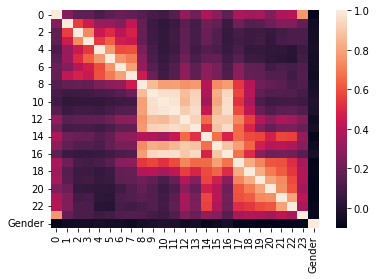

In [203]:
outcomes['Gender'] = train_genders

<AxesSubplot:>

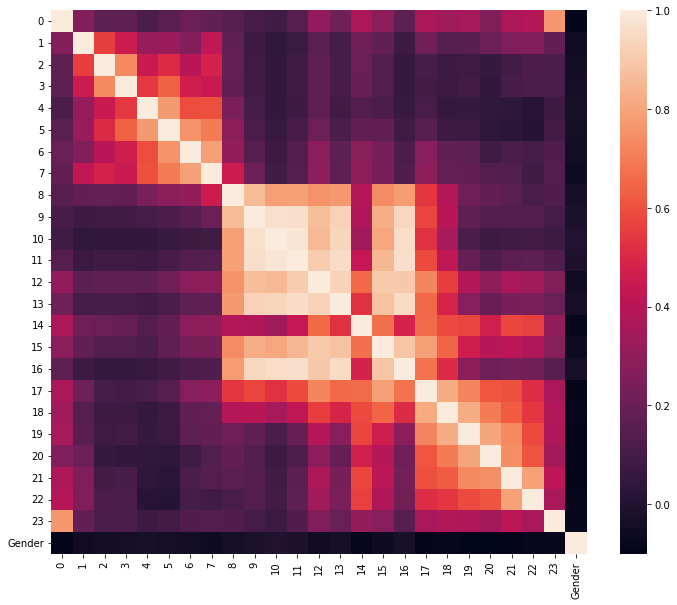

In [205]:
plt.figure(figsize=(12,10))
sns.heatmap(outcomes.corr())

In [43]:
transactions_merged['H'] = transactions['trans_time'].str[-8:-6].astype('int')
transactions_merged['Day'] = transactions_merged['trans_time'].str[:-9].astype('int')
transactions_merged[''].head()

,client_id,trans_time,mcc_code,trans_type,amount,term_id,trans_city,Unnamed: 0,gender,H,Day
0,d1bbbc9a0e0410d3cf12a3d2f44f3450,35 08:24:41,22,23,-1808.56,NaN,7,7196,0,8,35
1,d1bbbc9a0e0410d3cf12a3d2f44f3450,105 12:57:32,22,23,-3390.41,NaN,7,7196,0,13,105
2,d1bbbc9a0e0410d3cf12a3d2f44f3450,455 19:32:01,20,2,-144.50,889003,7,7196,0,16,455
3,d1bbbc9a0e0410d3cf12a3d2f44f3450,83 09:22:26,124,10,-3542.30,NaN,7,7196,0,11,83
4,d1bbbc9a0e0410d3cf12a3d2f44f3450,74 13:31:57,124,10,-3542.70,NaN,7,7196,0,13,74


<AxesSubplot:xlabel='Day', ylabel='Count'>

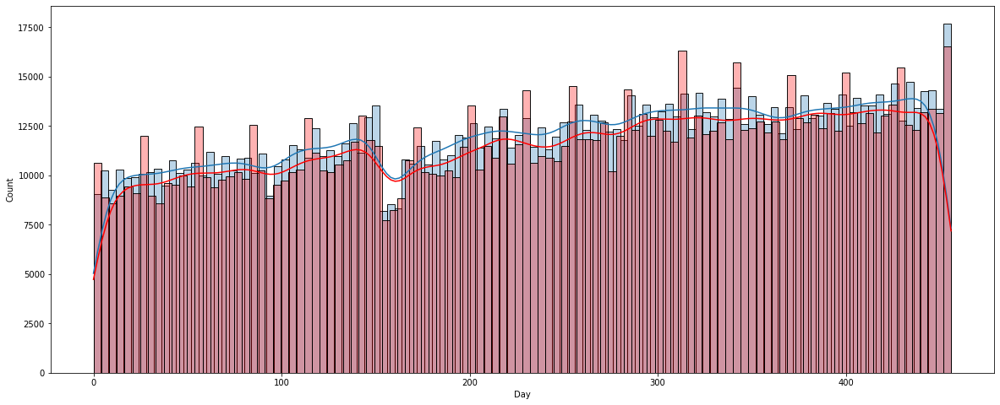

In [109]:
plt.figure(figsize=(20,8))
sns.histplot(data = transactions_merged[(transactions_merged['gender'] == 0) & (transactions_merged['amount'] < 0)], x = 'Day', alpha =.3, kde = True)
sns.histplot(data = transactions_merged[(transactions_merged['gender'] == 1) & (transactions_merged['amount'] < 0)], x = 'Day', color = 'red', alpha = .3, kde = True)

<AxesSubplot:xlabel='trans_type', ylabel='Count'>

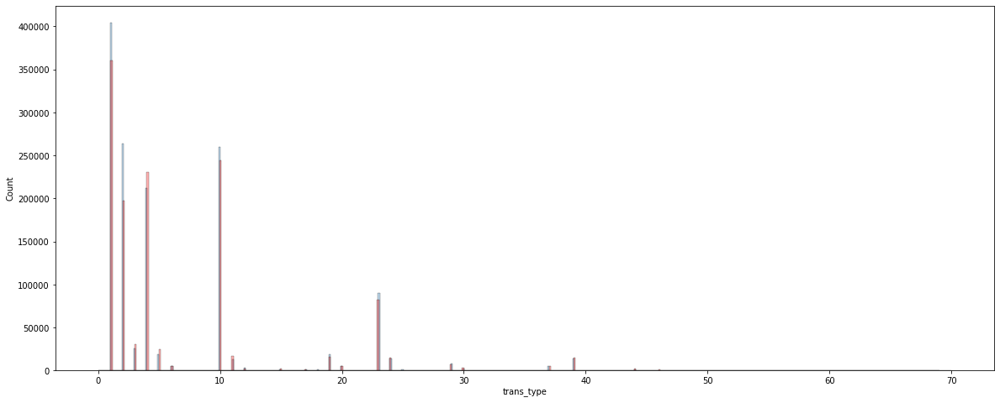

In [92]:
plt.figure(figsize=(20,8))
sns.histplot(data = transactions_merged[(transactions_merged['gender'] == 0) & (transactions_merged['amount'] < 0)], x = 'trans_type', alpha =.3)
sns.histplot(data = transactions_merged[(transactions_merged['gender'] == 1) & (transactions_merged['amount'] < 0)], x = 'trans_type', color = 'red', alpha = .3)

In [102]:
len(transactions_merged['trans_type'].unique())

75

<AxesSubplot:xlabel='trans_type', ylabel='Count'>

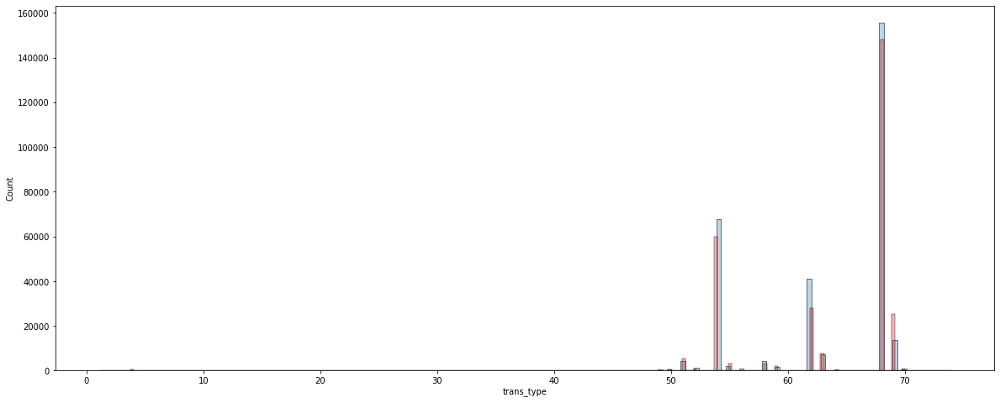

In [106]:
plt.figure(figsize=(20,8))
sns.histplot(data = transactions_merged[(transactions_merged['gender'] == 0) & (transactions_merged['amount'] > 0)], x = 'trans_type', alpha =.3)
sns.histplot(data = transactions_merged[(transactions_merged['gender'] == 1) & (transactions_merged['amount'] > 0)], x = 'trans_type', color = 'red', alpha = .3)
#plt.ylim((0,1000))

<AxesSubplot:xlabel='trans_type', ylabel='Count'>

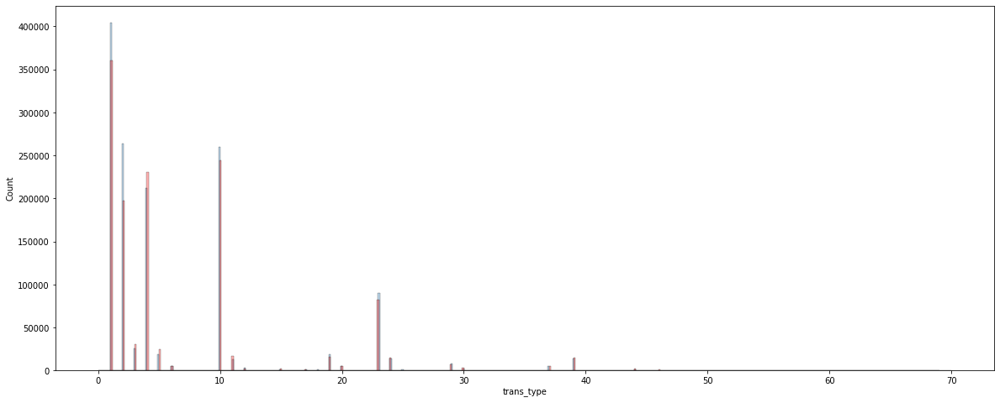

In [107]:
plt.figure(figsize=(20,8))
sns.histplot(data = transactions_merged[(transactions_merged['gender'] == 0) & (transactions_merged['amount'] < 0)], x = 'trans_type', alpha =.3)
sns.histplot(data = transactions_merged[(transactions_merged['gender'] == 1) & (transactions_merged['amount'] < 0)], x = 'trans_type', color = 'red', alpha = .3)

<AxesSubplot:xlabel='trans_type', ylabel='Count'>

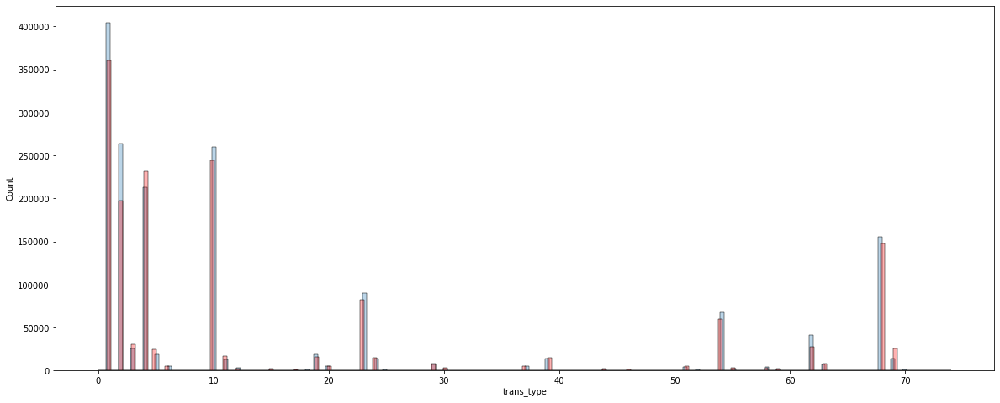

In [108]:
plt.figure(figsize=(20,8))
sns.histplot(data = transactions_merged[(transactions_merged['gender'] == 0)], x = 'trans_type', alpha =.3)
sns.histplot(data = transactions_merged[(transactions_merged['gender'] == 1)], x = 'trans_type', color = 'red', alpha = .3)

In [116]:
transactions_merged.head()

,client_id,trans_time,mcc_code,trans_type,amount,term_id,trans_city,Unnamed: 0,gender,H,Day
0,d1bbbc9a0e0410d3cf12a3d2f44f3450,35 08:24:41,22,23,-1808.56,NaN,7,7196,0,8,35
1,d1bbbc9a0e0410d3cf12a3d2f44f3450,105 12:57:32,22,23,-3390.41,NaN,7,7196,0,13,105
2,d1bbbc9a0e0410d3cf12a3d2f44f3450,455 19:32:01,20,2,-144.50,889003,7,7196,0,16,455
3,d1bbbc9a0e0410d3cf12a3d2f44f3450,83 09:22:26,124,10,-3542.30,NaN,7,7196,0,11,83
4,d1bbbc9a0e0410d3cf12a3d2f44f3450,74 13:31:57,124,10,-3542.70,NaN,7,7196,0,13,74


In [114]:
from tqdm.notebook import tqdm
tqdm.pandas()
def features_creation_advanced(x): 
    features = []
    features.append(pd.Series(x[x['amount']>0]['amount'].agg(['min', 'max', 'mean', 'median', 'std', 'count'])\
                                                        .add_prefix('positive_transactions_')))
    features.append(pd.Series(x[x['amount']<0]['amount'].agg(['min', 'max', 'mean', 'median', 'std', 'count'])\
                                                        .add_prefix('negative_transactions_')))
    return pd.concat(features)

x = transactions_merged.groupby(transactions_merged.index).progress_apply(features_creation_advanced).unstack(-1)

  0%|          | 0/3238732 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [103]:
# Словарь с ключом = ID клиента и значением = Пол.
gender_dict = dict(train[['client_id', 'gender']].values)
# Аррау айдишников из трэйна
train_ids = list(gender_dict.keys())
# Аррау полов из трэйна
train_genders = list(gender_dict.values())

In [104]:
tt_len = len(transactions_merged['trans_type'].unique())
incomes_tt_dict = {key: [0]*tt_len for key in train_ids}
incomes_tt = transactions_merged[transactions_merged['amount'] > 0].reset_index(drop=True)

for index in range(len(incomes_tt)):
    incomes_tt_dict[incomes_tt.iloc[index, 0]][incomes_tt.iloc[index, 3]] += 1

In [105]:
pd.DataFrame(incomes_tt_dict).T

,0,1,2,3,4,5,6,7,8,9,...,65,66,67,68,69,70,71,72,73,74
c5f18a1d1d83fda62e51e6ae1d7b8911,0,0,0,0,0,0,0,0,0,0,...,0,0,0,14,5,0,0,0,0,0
4b6861803556de90249e13d7cf66f0a9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,10,0,0,0,0,0,0
7d3f908e1cd1e3624a1445df5e04c4fa,0,0,0,0,0,0,0,0,0,0,...,0,0,0,10,0,0,0,0,0,0
40c585a809c1bd17dc6d283d61acd2d2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,5,0,0,0,0,0,0
5bd2ff9f6c591353577488b0dfca6dea,0,0,0,2,0,0,0,0,0,0,...,0,0,0,21,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
596baadc284cb94a91c1fdd7a422a022,0,0,0,0,0,0,0,0,0,0,...,0,0,0,37,0,0,0,0,0,0
9b317a4cff6bb3b630cd966f68db410b,0,0,0,0,0,0,0,0,0,0,...,0,0,0,5,0,0,0,0,0,0
eb3b544e3c5293739f09dcd71a649b18,0,0,0,0,0,0,0,0,0,0,...,0,0,0,8,0,0,0,0,0,0
e1c1a70bfcb000d1188745cef71b3b61,0,0,0,0,0,0,0,0,0,0,...,0,0,0,4,2,0,0,0,0,0


In [72]:
rasxod = transactions_merged[transactions_merged['amount'] < 0]
rasxod.head()

,client_id,trans_time,mcc_code,trans_type,amount,term_id,trans_city,Unnamed: 0,gender,H,Day
0,d1bbbc9a0e0410d3cf12a3d2f44f3450,35 08:24:41,22,23,-1808.56,NaN,7,7196,0,8,35
1,d1bbbc9a0e0410d3cf12a3d2f44f3450,105 12:57:32,22,23,-3390.41,NaN,7,7196,0,13,105
2,d1bbbc9a0e0410d3cf12a3d2f44f3450,455 19:32:01,20,2,-144.50,889003,7,7196,0,16,455
3,d1bbbc9a0e0410d3cf12a3d2f44f3450,83 09:22:26,124,10,-3542.30,NaN,7,7196,0,11,83
4,d1bbbc9a0e0410d3cf12a3d2f44f3450,74 13:31:57,124,10,-3542.70,NaN,7,7196,0,13,74


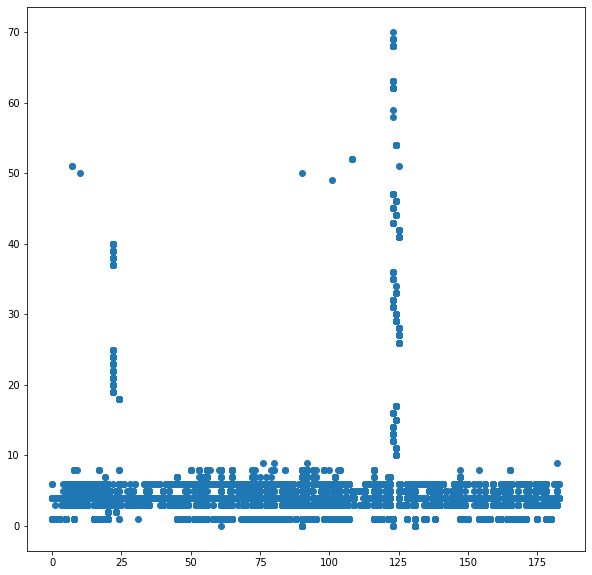

In [74]:
plt.figure(figsize=(10,10))
plt.scatter(rasxod['mcc_code'], rasxod['trans_type'])

<AxesSubplot:xlabel='trans_city', ylabel='Count'>

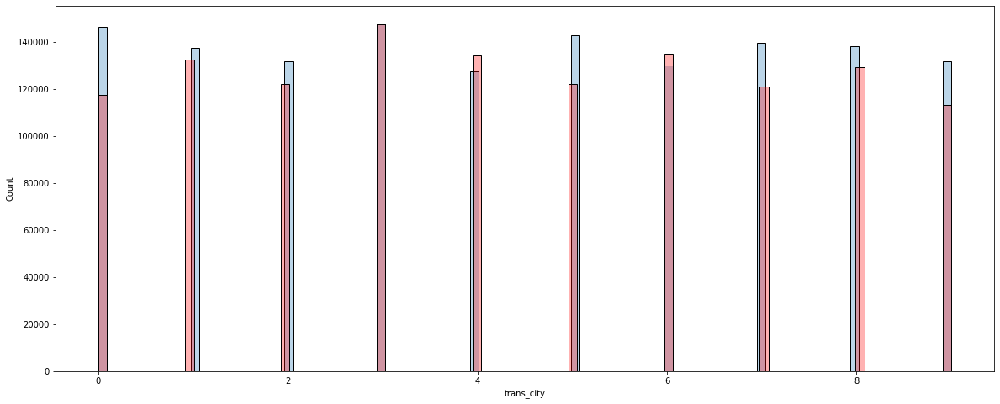

In [82]:
plt.figure(figsize=(20,8))
sns.histplot(data = transactions_merged[(transactions_merged['gender'] == 0) & (transactions_merged['amount'] < 0)], x = 'trans_city', alpha =.3)
sns.histplot(data = transactions_merged[(transactions_merged['gender'] == 1) & (transactions_merged['amount'] < 0)], x = 'trans_city', color = 'red', alpha = .3)

<AxesSubplot:xlabel='trans_type', ylabel='Count'>

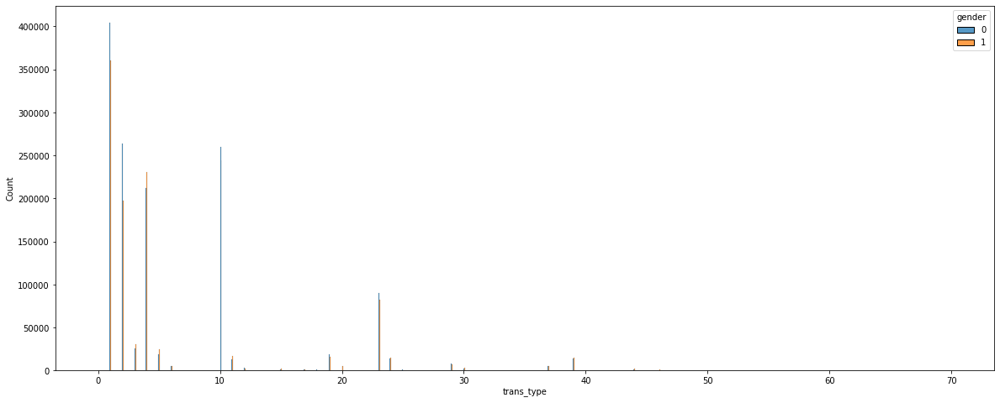

In [90]:
plt.figure(figsize=(20,8))
sns.histplot(data = transactions_merged[transactions_merged['amount'] < 0], x = 'trans_type', hue = 'gender', multiple="dodge")

In [54]:
len(transactions_merged['Day'].unique())/30

15.233333333333333

<AxesSubplot:xlabel='mcc_code', ylabel='Density'>

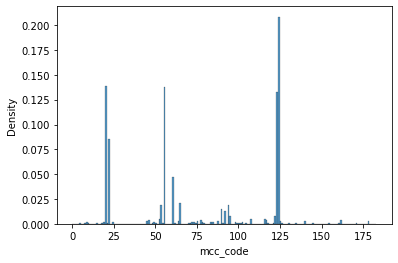

In [31]:
plt.plot(figsize=(10,10))
sns.histplot(transactions_merged['mcc_code'], stat = 'density')
#plt.ylim()

In [ ]:
plt.plot(figsize=(10,10))
sns.histplot(transactions_merged['mcc_'].value_counts())

In [68]:
t['mcc_code'].values

array([ 22,  22,  20, ..., 124, 124,  22], dtype=int64)

In [193]:
pd.DataFrame(incomes_at_hour).T.to_csv('Incomes_at_hour.csv')

In [181]:
pd.DataFrame(cities).T.to_csv('Citites distribution.csv')

In [166]:
pd.DataFrame(outcomes).T.to_csv('Outcomes.csv')

In [184]:
pd.DataFrame(incomes)

,c5f18a1d1d83fda62e51e6ae1d7b8911,4b6861803556de90249e13d7cf66f0a9,7d3f908e1cd1e3624a1445df5e04c4fa,40c585a809c1bd17dc6d283d61acd2d2,5bd2ff9f6c591353577488b0dfca6dea,d9f80be35fdf6985a6558f67efb75672,7d556da1e6f8e1cb37e9c019e7f4bd7d,d57abf5a2659b2d82e29a70ad19dd2d4,2f84d07c7be4e58402c96f127b2b4a0f,a2aaf25e753921f5eb6a489baef56916,...,08f13f1b12009f1924e09b43f7882e89,e8942087f60bb656b52b08e0bb4a2b1b,e783a1087006ff48239f85adbafb3283,bdc028714076badd53cbca3850505248,d24336c5cda7246bd046c941a556eab2,596baadc284cb94a91c1fdd7a422a022,9b317a4cff6bb3b630cd966f68db410b,eb3b544e3c5293739f09dcd71a649b18,e1c1a70bfcb000d1188745cef71b3b61,e4347a1a2a6c2bc66818209d74d415e2
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
180,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
181,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
182,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [103]:
transactions_merged = pd.merge(transactions, train, on=['client_id'])

In [98]:
len(mcc)

184

In [84]:
len(trans_types)

155

In [60]:
# Словарь с ключом = ID клиента и значением = Пол.
gender_dict = dict(train[['client_id', 'gender']].values)
# Аррау айдишников из трэйна
train_ids = list(gender_dict.keys())
# Аррау полов из трэйна
train_genders = list(gender_dict.values())

In [173]:
pd.DataFrame(gender_dict, index = [0]).T.to_csv('genders.csv')

In [94]:
mcc['mcc_code'].unique()

array([ 742, 1711, 1731, 1799, 2741, 3000, 3351, 3501, 4111, 4112, 4121,
       4131, 4214, 4215, 4411, 4511, 4722, 4784, 4789, 4812, 4814, 4816,
       4829, 4899, 4900, 5013, 5039, 5044, 5045, 5047, 5065, 5072, 5074,
       5085, 5094, 5099, 5111, 5122, 5131, 5137, 5169, 5172, 5192, 5193,
       5199, 5200, 5211, 5231, 5251, 5261, 5300, 5309, 5310, 5311, 5331,
       5399, 5411, 5422, 5441, 5451, 5462, 5499, 5511, 5532, 5533, 5541,
       5542, 5571, 5599, 5611, 5621, 5631, 5641, 5651, 5655, 5661, 5681,
       5691, 5697, 5699, 5712, 5713, 5714, 5719, 5722, 5732, 5733, 5734,
       5735, 5811, 5812, 5813, 5814, 5816, 5912, 5921, 5931, 5940, 5941,
       5942, 5943, 5944, 5945, 5946, 5947, 5948, 5949, 5950, 5964, 5965,
       5967, 5968, 5969, 5970, 5971, 5976, 5977, 5983, 5992, 5993, 5994,
       5995, 5999, 6010, 6011, 6012, 6051, 6211, 6300, 6513, 6536, 7011,
       7210, 7216, 7221, 7230, 7273, 7278, 7298, 7299, 7311, 7338, 7372,
       7375, 7395, 7399, 7512, 7523, 7531, 7538, 75

In [109]:
le = LabelEncoder()
le.fit(mcc['mcc_code'].unique())
transactions_merged['mcc_code'] = le.transform(transactions_merged['mcc_code'])

le = LabelEncoder()
le.fit(trans_types['trans_type'].unique())
transactions_merged['trans_type'] = le.transform(transactions_merged['trans_type'])

ValueError: y contains previously unseen labels: [2446, 2456, 2460, 4096, 4097]

In [97]:
le.transform(mcc['mcc_code'].unique())

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [61]:
transactions_merged = pd.merge(transactions, train, on=['client_id'])

In [101]:
transactions_merged['mcc_code'] = le.transform(transactions_merged['mcc_code'])

In [102]:
transactions_merged

,client_id,trans_time,mcc_code,trans_type,amount,term_id,trans_city,Unnamed: 0,gender
0,d1bbbc9a0e0410d3cf12a3d2f44f3450,35 08:24:41,22,2370,-1808.56,NaN,Tver,7196,0
1,d1bbbc9a0e0410d3cf12a3d2f44f3450,105 12:57:32,22,2370,-3390.41,NaN,Tver,7196,0
2,d1bbbc9a0e0410d3cf12a3d2f44f3450,455 19:32:01,20,1030,-144.50,889003,Tver,7196,0
3,d1bbbc9a0e0410d3cf12a3d2f44f3450,83 09:22:26,124,2010,-3542.30,NaN,Tver,7196,0
4,d1bbbc9a0e0410d3cf12a3d2f44f3450,74 13:31:57,124,2010,-3542.70,NaN,Tver,7196,0
...,...,...,...,...,...,...,...,...,...
3238727,b6714c0ca16193cbd419623eb70b1488,445 16:57:21,20,1030,-73.31,941133,Khabarovsk,1652,1
3238728,ee4c5d78cbb27771979714ffa903ef5d,313 15:12:47,124,7010,72.71,483632,Moscow,690,0
3238729,d428ad799c5790b036beb67cc1b81075,445 16:37:17,124,2010,-14463.42,10172441,Khabarovsk,204,0
3238730,d428ad799c5790b036beb67cc1b81075,433 16:39:52,124,2010,-18078.07,10172440,Khabarovsk,204,0


In [86]:
mcc_v = {key: [0]*len(mcc) for key in train_ids}
trans_types_v = {key: [0]*len(trans_types) for key in train_ids}

In [22]:
len(train)

7560

In [23]:
len(test)

840

In [25]:
train_ids = train['client_id'].values.astype(str)
test_ids = test['client_id'].values.astype(str)
x = 0
for i in test_ids:
    if i in train_ids:
        x += 1
        #print(i)
x

0

In [ ]:
def data_preprocessing(transactions, train):
    '''
    Input params:
        :transactions (pandas.DataFrame) - dataframe of transactions with necessary columns ['amount', 'trans_time']. 
        Where amount - any float number, trans_time format - Day HH:MM:SS, day - any integer.
        
        :train (pandas.DataFrame) - dataframe with columns ['client_id', 'gender'].
        
    Output:
        :transactions_merged (pandas.DataFrame) - new dataframe with new columns:
            'Day' - a day of a transaction,
            'HMS' - precise float values of transactions hours,
            'Time x_coord' - x coordinate for time in polar coordinates
            'Time y_coord' - y coordinate for time in polar coordinates
            0,1,2,3,4,5,6,7,8,9 - index of a city after one hot encoding.
    '''
    # Find all available clients with known genders.
    transactions_merged = pd.merge(transactions, train, on=['client_id'])
    
    #Separate date.
    transactions_merged['Day'] = transactions_merged['trans_time'].str[:-9].astype('int')
    
    # Create column HMS - precise float values of transactions hours.
    transactions_merged['HMS'] = transactions['trans_time'].str[-8:-6].astype('int') + transactions['trans_time'].str[-5:-3].astype('int')/60 + transactions['trans_time'].str[-2:].astype('int')/3600
            
    transactions_merged.drop(columns = ['Unnamed: 0'], inplace = True)

    # Convert time to polar coordinates. (x, y) in this coordinates - position of the hour hand on a clock.
    transactions_merged['Time x_coord'] = np.cos(2 * np.pi * transactions_merged['HMS']/24)
    transactions_merged['Time y_coord'] = np.sin(2 * np.pi * transactions_merged['HMS']/24)
 
    # One hot encoding for cities.
    transactions_merged['trans_city'] = transactions_merged['trans_city'].astype('category') 
    
    enc = OneHotEncoder() 
    enc_data = pd.DataFrame(enc.fit_transform(transactions_merged[['trans_city']]).toarray()).astype('int8')
    transactions_merged = transactions_merged.join(enc_data)
    
    # Scaling amount
    scaler = StandardScaler()
    transactions_merged['Amount scaled'] = scaler.fit_transform(transactions_merged['amount'].values.reshape(-1,1))
    
    return transactions_merged

In [73]:
data_preprocessing()

,client_id,trans_time,mcc_code,trans_type,amount,term_id,trans_city,gender,Day,Hours,...,1,2,3,4,5,6,7,8,9,Amount scaled
0,d1bbbc9a0e0410d3cf12a3d2f44f3450,35 08:24:41,4829,2370,-1808.56,NaN,Tver,0,35,8,...,0,0,0,0,0,0,1,0,0,-0.063826
1,d1bbbc9a0e0410d3cf12a3d2f44f3450,105 12:57:32,4829,2370,-3390.41,NaN,Tver,0,105,13,...,0,0,0,0,0,0,1,0,0,-0.153371
2,d1bbbc9a0e0410d3cf12a3d2f44f3450,455 19:32:01,4814,1030,-144.50,889003,Tver,0,455,16,...,0,0,0,0,0,0,1,0,0,0.030372
3,d1bbbc9a0e0410d3cf12a3d2f44f3450,83 09:22:26,6011,2010,-3542.30,NaN,Tver,0,83,11,...,0,0,0,0,0,0,1,0,0,-0.161969
4,d1bbbc9a0e0410d3cf12a3d2f44f3450,74 13:31:57,6011,2010,-3542.70,NaN,Tver,0,74,13,...,0,0,0,0,0,0,1,0,0,-0.161992
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3238727,b6714c0ca16193cbd419623eb70b1488,445 16:57:21,4814,1030,-73.31,941133,Khabarovsk,1,445,12,...,0,1,0,0,0,0,0,0,0,0.034402
3238728,ee4c5d78cbb27771979714ffa903ef5d,313 15:12:47,6011,7010,72.71,483632,Moscow,0,313,5,...,0,0,1,0,0,0,0,0,0,0.042668
3238729,d428ad799c5790b036beb67cc1b81075,445 16:37:17,6011,2010,-14463.42,10172441,Khabarovsk,0,445,19,...,0,1,0,0,0,0,0,0,0,-0.780188
3238730,d428ad799c5790b036beb67cc1b81075,433 16:39:52,6011,2010,-18078.07,10172440,Khabarovsk,0,433,10,...,0,1,0,0,0,0,0,0,0,-0.984804


In [42]:
transactions_merged['Day'] = transactions_merged['trans_time'].str[:-9].astype('int')
transactions_merged['Hours'] = transactions['trans_time'].str[-8:-6].astype('int')
transactions_merged['Minute'] = transactions['trans_time'].str[-5:-3].astype('int')
transactions_merged['Sec'] = transactions['trans_time'].str[-2:].astype('int')

transactions_merged['HMS'] = transactions_merged['Hours'] + transactions_merged['Minute']/60 + transactions_merged['Sec']/3600
transactions_merged.drop(columns = ['Unnamed: 0'], inplace = True)

hours_encode(transactions_merged, 'HMS', 24)

,client_id,trans_time,mcc_code,trans_type,amount,term_id,trans_city,gender,Day,Hours,Minute,Sec,HMS,Time x_coord,Time y_coord
0,d1bbbc9a0e0410d3cf12a3d2f44f3450,35 08:24:41,4829,2370,-1808.56,NaN,Tver,0,35,8,24,41,8.411389,-0.590195,0.807261
1,d1bbbc9a0e0410d3cf12a3d2f44f3450,105 12:57:32,4829,2370,-3390.41,NaN,Tver,0,105,13,27,15,13.454167,-0.928405,-0.371570
2,d1bbbc9a0e0410d3cf12a3d2f44f3450,455 19:32:01,4814,1030,-144.50,889003,Tver,0,455,16,3,59,16.066389,-0.484873,-0.874584
3,d1bbbc9a0e0410d3cf12a3d2f44f3450,83 09:22:26,6011,2010,-3542.30,NaN,Tver,0,83,11,54,12,11.903333,-0.999680,0.025305
4,d1bbbc9a0e0410d3cf12a3d2f44f3450,74 13:31:57,6011,2010,-3542.70,NaN,Tver,0,74,13,11,45,13.195833,-0.951393,-0.307979
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3238727,b6714c0ca16193cbd419623eb70b1488,445 16:57:21,4814,1030,-73.31,941133,Khabarovsk,1,445,12,20,26,12.340556,-0.996028,-0.089039
3238728,ee4c5d78cbb27771979714ffa903ef5d,313 15:12:47,6011,7010,72.71,483632,Moscow,0,313,5,45,55,5.765278,0.061411,0.998113
3238729,d428ad799c5790b036beb67cc1b81075,445 16:37:17,6011,2010,-14463.42,10172441,Khabarovsk,0,445,19,45,33,19.759167,0.444440,-0.895809
3238730,d428ad799c5790b036beb67cc1b81075,433 16:39:52,6011,2010,-18078.07,10172440,Khabarovsk,0,433,10,28,12,10.470000,-0.920845,0.389928


In [43]:
transactions_merged['trans_city'] = transactions_merged['trans_city'].astype('category') 
enc = OneHotEncoder() 
  
enc_data = pd.DataFrame(enc.fit_transform(transactions_merged[['trans_city']]).toarray()).astype('int8')
   
transactions_merged = transactions_merged.join(enc_data) 
  
transactions_merged.head()

,client_id,trans_time,mcc_code,trans_type,amount,term_id,trans_city,gender,Day,Hours,...,0,1,2,3,4,5,6,7,8,9
0,d1bbbc9a0e0410d3cf12a3d2f44f3450,35 08:24:41,4829,2370,-1808.56,NaN,Tver,0,35,8,...,0,0,0,0,0,0,0,1,0,0
1,d1bbbc9a0e0410d3cf12a3d2f44f3450,105 12:57:32,4829,2370,-3390.41,NaN,Tver,0,105,13,...,0,0,0,0,0,0,0,1,0,0
2,d1bbbc9a0e0410d3cf12a3d2f44f3450,455 19:32:01,4814,1030,-144.50,889003,Tver,0,455,16,...,0,0,0,0,0,0,0,1,0,0
3,d1bbbc9a0e0410d3cf12a3d2f44f3450,83 09:22:26,6011,2010,-3542.30,NaN,Tver,0,83,11,...,0,0,0,0,0,0,0,1,0,0
4,d1bbbc9a0e0410d3cf12a3d2f44f3450,74 13:31:57,6011,2010,-3542.70,NaN,Tver,0,74,13,...,0,0,0,0,0,0,0,1,0,0


In [44]:
scaler = StandardScaler()
transactions_merged['Amount scaled'] = scaler.fit_transform(transactions_merged['amount'].values.reshape(-1,1))

In [45]:
transactions_merged.head()

,client_id,trans_time,mcc_code,trans_type,amount,term_id,trans_city,gender,Day,Hours,...,1,2,3,4,5,6,7,8,9,Amount scaled
0,d1bbbc9a0e0410d3cf12a3d2f44f3450,35 08:24:41,4829,2370,-1808.56,NaN,Tver,0,35,8,...,0,0,0,0,0,0,1,0,0,-0.063826
1,d1bbbc9a0e0410d3cf12a3d2f44f3450,105 12:57:32,4829,2370,-3390.41,NaN,Tver,0,105,13,...,0,0,0,0,0,0,1,0,0,-0.153371
2,d1bbbc9a0e0410d3cf12a3d2f44f3450,455 19:32:01,4814,1030,-144.50,889003,Tver,0,455,16,...,0,0,0,0,0,0,1,0,0,0.030372
3,d1bbbc9a0e0410d3cf12a3d2f44f3450,83 09:22:26,6011,2010,-3542.30,NaN,Tver,0,83,11,...,0,0,0,0,0,0,1,0,0,-0.161969
4,d1bbbc9a0e0410d3cf12a3d2f44f3450,74 13:31:57,6011,2010,-3542.70,NaN,Tver,0,74,13,...,0,0,0,0,0,0,1,0,0,-0.161992


In [46]:
tokenizer = AutoTokenizer.from_pretrained("cointegrated/rubert-tiny")
model = AutoModel.from_pretrained("cointegrated/rubert-tiny")

def embed_bert_cls(text, model, tokenizer):
    t = tokenizer(text, padding=True, truncation=True, return_tensors='pt')
    with torch.no_grad():
        model_output = model(**{k: v.to(model.device) for k, v in t.items()})
    embeddings = model_output.last_hidden_state[:, 0, :]
    embeddings = torch.nn.functional.normalize(embeddings)
    return embeddings[0].cpu().numpy()
def embed(row):
    return embed_bert_cls(row, model, tokenizer)

Some weights of the model checkpoint at cointegrated/rubert-tiny were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [47]:
#transactions_merged['amount'] = transactions_merged['amount']/transactions_merged['amount'].max()

In [48]:
#mcc_array = []
#for i in range(transactions_merged.shape[0]):
#    embed_bert_cls(transactions_merged['mcc_code'], model, tokenizer)

In [49]:
mcc['embed_mcc'] = mcc['mcc_description'].apply(embed)
trans_types['embed_trans_type'] = trans_types['trans_description'].apply(embed)

In [50]:
transactions_merged = pd.merge(transactions_merged, mcc, on=['mcc_code'])
transactions_merged = pd.merge(transactions_merged, trans_types, on=['trans_type'])

In [51]:
transactions_merged.head()

,client_id,trans_time,mcc_code,trans_type,amount,term_id,trans_city,gender,Day,Hours,...,5,6,7,8,9,Amount scaled,mcc_description,embed_mcc,trans_description,embed_trans_type
0,d1bbbc9a0e0410d3cf12a3d2f44f3450,35 08:24:41,4829,2370,-1808.56,NaN,Tver,0,35,8,...,0,0,1,0,0,-0.063826,Денежные переводы,"[-0.018846663, -0.02290359, -0.024004884, -0.0...",Списание с карты на карту по операции <перевод...,"[-0.026591294, -0.021923857, -0.09033733, -0.0..."
1,d1bbbc9a0e0410d3cf12a3d2f44f3450,105 12:57:32,4829,2370,-3390.41,NaN,Tver,0,105,13,...,0,0,1,0,0,-0.153371,Денежные переводы,"[-0.018846663, -0.02290359, -0.024004884, -0.0...",Списание с карты на карту по операции <перевод...,"[-0.026591294, -0.021923857, -0.09033733, -0.0..."
2,d1bbbc9a0e0410d3cf12a3d2f44f3450,74 14:29:42,4829,2370,-6155.97,NaN,Tver,0,74,11,...,0,0,1,0,0,-0.309923,Денежные переводы,"[-0.018846663, -0.02290359, -0.024004884, -0.0...",Списание с карты на карту по операции <перевод...,"[-0.026591294, -0.021923857, -0.09033733, -0.0..."
3,d1bbbc9a0e0410d3cf12a3d2f44f3450,119 15:01:24,4829,2370,-1447.13,NaN,Tver,0,119,20,...,0,0,1,0,0,-0.043366,Денежные переводы,"[-0.018846663, -0.02290359, -0.024004884, -0.0...",Списание с карты на карту по операции <перевод...,"[-0.026591294, -0.021923857, -0.09033733, -0.0..."
4,d1bbbc9a0e0410d3cf12a3d2f44f3450,17 09:40:16,4829,2370,-724.03,NaN,Tver,0,17,9,...,0,0,1,0,0,-0.002433,Денежные переводы,"[-0.018846663, -0.02290359, -0.024004884, -0.0...",Списание с карты на карту по операции <перевод...,"[-0.026591294, -0.021923857, -0.09033733, -0.0..."


In [52]:
df_explore = transactions_merged[['client_id', 'amount', 'embed_mcc','embed_trans_type','Time x_coord', 'Time y_coord', 0, 1, 2, 3, 4, 5, 6, 7, 8, 9,'gender']]

In [53]:
df_explore.head()

,client_id,amount,embed_mcc,embed_trans_type,Time x_coord,Time y_coord,0,1,2,3,4,5,6,7,8,9,gender
0,d1bbbc9a0e0410d3cf12a3d2f44f3450,-1808.56,"[-0.018846663, -0.02290359, -0.024004884, -0.0...","[-0.026591294, -0.021923857, -0.09033733, -0.0...",-0.590195,0.807261,0,0,0,0,0,0,0,1,0,0,0
1,d1bbbc9a0e0410d3cf12a3d2f44f3450,-3390.41,"[-0.018846663, -0.02290359, -0.024004884, -0.0...","[-0.026591294, -0.021923857, -0.09033733, -0.0...",-0.928405,-0.371570,0,0,0,0,0,0,0,1,0,0,0
2,d1bbbc9a0e0410d3cf12a3d2f44f3450,-6155.97,"[-0.018846663, -0.02290359, -0.024004884, -0.0...","[-0.026591294, -0.021923857, -0.09033733, -0.0...",-0.990539,0.137228,0,0,0,0,0,0,0,1,0,0,0
3,d1bbbc9a0e0410d3cf12a3d2f44f3450,-1447.13,"[-0.018846663, -0.02290359, -0.024004884, -0.0...","[-0.026591294, -0.021923857, -0.09033733, -0.0...",0.532014,-0.846735,0,0,0,0,0,0,0,1,0,0,0
4,d1bbbc9a0e0410d3cf12a3d2f44f3450,-724.03,"[-0.018846663, -0.02290359, -0.024004884, -0.0...","[-0.026591294, -0.021923857, -0.09033733, -0.0...",-0.802340,0.596867,0,0,0,0,0,0,0,1,0,0,0


In [58]:
from sklearn.preprocessing import StandardScaler

In [59]:
scaler = StandardScaler()
df_explore['Amount scaled'] = scaler.fit_transform(transactions_merged['amount'].values.reshape(-1,1))

In [60]:
df_explore.drop(columns=['amount'], inplace = True)

KeyError: "['amount'] not found in axis"

In [ ]:
df_explore.head()

In [ ]:
df_explore['embed_mcc']

In [17]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score

In [18]:
embed_mcc_cols = df_explore['embed_mcc'].apply(pd.Series)
y = df_explore['gender']
embed_trans_type_cols = df_explore['embed_trans_type'].apply(pd.Series)
X = pd.concat([embed_mcc_cols, embed_trans_type_cols, df_explore[['amount', 'Hours']]], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

KeyboardInterrupt: 

In [ ]:
X_train = X_train.to_numpy()
X_test = X_test.to_numpy()
y_train = y_train.to_numpy()
y_test = y_test.to_numpy()

In [ ]:
xgb_config = {'use_gpu': True}
model = xgb.XGBClassifier(**xgb_config)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
auc_score = roc_auc_score(y_test, y_pred)
print("ROC-AUC Score:", auc_score)